# Assignment 2(A): Applying Decision Tree and Random Forest Algorithms to Automobile Loan Evaluation

### Acknowledgment

You are required to acknowledge the following statement by entering your full name, SID, and date below:

"By continuing to work on or submit this deliverable, I acknowledge that my submission is entirely my independent original work done exclusively for this assessment item. I agree to: 

* Submit only my independent original work
* Not share answers and content of this assessment with others
* Report suspected violations to the instructor

Furthermore, I acknowledge that I have not engaged and will not engage in any activities that dishonestly improve my results or dishonestly improve/hurt the results of others, and that I abide to all academic honor codes set by the University."

**Your full name:**removed

**Your SID:**removed

**Date:**24-JUN-2022

## 1. Introduction <a id='section_1'></a>
In this part of the assignment, you will implement the decision tree and random forest learning algorithms, and use the models learned by these algorithms to make decisions on automobile loan application. You are required to complete the lines between __START YOUR CODE HERE__ and __END YOUR CODE HERE__ (if applicable) and to execute each cell. Within each coding block, you are required to enter your code to replace `None` after the `=` sign (except otherwise stated). You are not allowed to use other libraries or files than those provided in this assignment. When entering your code, you should not change the names of variables, constants, and functions already listed. 

**Contents**

* [1. Introduction](#section_1)
* [2. Automobile Loan Dataset](#section_2)
    * [2.1. Data Description](#section_21)
    * [2.2. Data Loading](#section_22)
    * [2.3. Data visualization](#section_23)
    * [2.4. Data Processing](#section_24)
* [3. Decision Tree Learning Algorithm](#section_3)
    * [3.1. Tree Node](#section_31)
    * [3.2. Attribute Selection Measure](#section_32)
        * [3.2.1. Entropy](#section_321)
        * [3.2.2. Information gain](#section_322)
    * [3.3. Best Attribute Selection](#section_33)
    * [3.4. Recursive Tree Construction](#section_34)
    * [3.5. Predictive Function](#section_35)
    * [3.6. Tree Generation and Evaluation](#s36)
    * [3.7. Printing the Decision Tree](#s37)
* [4. Random Forest Learning Algorithm](#section_4)
    * [4.1. Forest Generation](#section_41)
    * [4.2. Predictive Function](#section_42)
    * [4.3. Performance Evaluation](#section_43)
* [5. Prediction of Sampled Data](#section_5)
* [6. Marking Scheme and Submission](#section_6)
* [7. Summary](#section_7)

Before we begin the exercises, we need to import all required libraries.

In [128]:
# Scientific and vector computation for python
import numpy as np

# Data analysis and manipulation tool for python
import pandas as pd

# Plotting library
import matplotlib.pyplot as plt 

# Unlike Assignment 1 that only uses basic libraries, 
# Assignment 2 utilizes sckit-learn libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn import tree
from sklearn.feature_extraction import DictVectorizer

# tells matplotlib to embed plots within the notebook
%matplotlib inline

## 2. Automobile Loan Dataset <a id='section_2'></a>
### 2.1. Data Description <a id='section_21'></a>
The dataset includes 7,180 records of automobile (used cars) loan applications processed by a bank. Each record is described by 27 features as listed below (an additional unnamed ID (first column) is not listed). The feature `LoanStatus` (approved or denied) is the target feature. The text file named `raw_classification_data.csv` stores each record as one row having the feature values separated by commas.

| Feature | Description 
|:----:|:- 
| ModifiedCreditScore | Greater of the Credit score and Co-Credit Score.
| ModifiedBankruptcyScore | Greater of the Bankruptcy score and Co-Bankruptcy Score.
| EmployedMonths | Stated number of months that the applicant has been employed with their current employer.
| TotalMonthlyIncome | Sum of the applicants and the co-applicants monthly income.
| PrimeMonthlyLiability | Stated non-rent liabilities of applicant.
| PrimeMonthlyRent | Applicant's stated monthly housing expense.
| TotalMonthlyDebtBeforeLoan | Sum of applicant and co-applicants housing payments and liabilities.
| VehicleYear | Year of the vehicle the applicant is looking to purchase.
| VehicleMileage | Number of miles on the vehicle the applicant is looking to purchase.
| TotalVehicleValue | Amount the vehicle is being sold for.
| AmountRequested | Amount the applicant is requesting to borrow.
| DownPayment | Amount of money the applicant is paying upfront toward the vehicle loan.
| Loanterm | Number of months applicant has to pay loan off.
| OccupancyDuration | Stated number of months the applicant has been in their current residence at the time of the application.
| EstimatedMonthlyPayment | Estimated monthly payment based on loan amount, interest rate, and loan term.
| NumberOfOpenRevolvingAccounts | Count of revolving accounts that appear on the applicant's credit report.
| LTV | Vehicle's loan to value ratio.
| DTI | Applicant's debt to income ratio based on credit report and loan type. 
| Source | Identifies channel from which application was received.
| EmploymentStatus | Indicates if the applicant was employed at the time application was submitted.
| VehicleMake | Make of the vehicle the applicant is looking to purchase.
| isNewVehicle | Indicates if the vehicle the applicant is looking to purchase is new or used.
| OccupancyStatus | Stated occupancy status of the applicant at the time of the application.
| RequestType | Type of vehicle loan requested by the applicant (Refinance, lease buyout, etc.)
| MemberIndicator | Indicates if applicant was a bank member before applying for loan
| CoApplicantIndicator | Indicates whether or not a co-applicant is present on the application
| LoanStatus | Indicates whether loan was approved or denied

### 2.2. Data Loading <a id='section_22'></a>
In this section, you use the pandas functions `read_csv()` to load the dataset, `info()` to generate a summary, `drop()` to drop the first unnamed feature column. You can optionally use `head()` to display first several records. 

In [129]:
# Load Data
raw_classification_data = pd.read_csv("raw_classification_data.csv")
raw_classification_data.drop('Unnamed: 0', axis=1, inplace=True)
raw_classification_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7180 entries, 0 to 7179
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   LoanStatus                     7180 non-null   object 
 1   Source                         7180 non-null   object 
 2   ModifiedCreditScore            7180 non-null   int64  
 3   ModifiedBankruptcyScore        7180 non-null   int64  
 4   EmploymentStatus               7180 non-null   object 
 5   EmployedMonths                 7180 non-null   int64  
 6   TotalMonthlyIncome             7180 non-null   float64
 7   PrimeMonthlyLiability          7180 non-null   float64
 8   PrimeMonthlyRent               7180 non-null   float64
 9   TotalMonthlyDebtBeforeLoan     7180 non-null   float64
 10  VehicleYear                    7180 non-null   int64  
 11  VehicleMake                    7180 non-null   object 
 12  VehicleMileage                 7180 non-null   f

### 2.3. Data Visualization <a id='section_23'></a>
You can visualize the distribution of each feature by executing the following code block. All numeric (continuous) features are visualized by blue bars, whereas all categorical features are visualized by red bars.

Attribute Number: 27


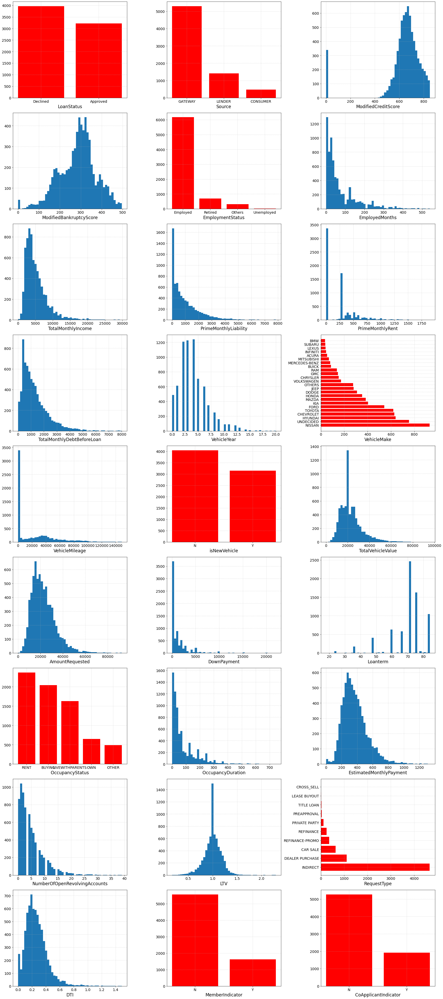

In [130]:
attribute_number = len(raw_classification_data.columns)
print("Attribute Number: {}".format(attribute_number))

# subplots 
fig = plt.figure(figsize=(24, 54))
ax = fig.subplots(attribute_number//3,3)
# iterations
for num, title in enumerate(raw_classification_data.columns):
    idx = num//3 # divided with no remainder
    idy = num%3  # remainder 
    if raw_classification_data[title].dtype in ['object']:
        value_count_dict = raw_classification_data[title].value_counts().to_dict()
        keys = list(value_count_dict.keys())
        values = list(value_count_dict.values())
        if len(raw_classification_data[title].unique().tolist()) < 8:
            ax[idx, idy].bar(keys, values, color='r')
        else:
            ax[idx, idy].barh(keys, values, color='r')
    else:
        ax[idx, idy].hist(raw_classification_data[title].values, bins=50);
    
    # set title with attribute
    ax[idx, idy].set_xlabel(title, fontsize=17)
    # set grid width
    ax[idx, idy].grid(linestyle='--', alpha=0.5)
    # font size of ticks
    ax[idx, idy].tick_params(labelsize=14)
plt.tight_layout()

### 2.4. Data Processing <a id='section_24'></a>
Compared with other learning algorithms such as linear and logistic regressions, decision tree algorithm requires only simple procedures for data pre-processing. 

1. separate the whole dataset with selected features and classification labels
2. separate training ($70\%$) and testing dataset ($30\%$) by `train_test_split()` using the [scikit-learn library](https://scikit-learn.org/). 

Note that one-hot encoding is not necessary in this task. 

In [131]:
# extract label name and feature name list
class_name = 'LoanStatus'
feature_name = list(raw_classification_data.columns)
feature_name.remove(class_name)

# separate features and labels (classes)
data_y = raw_classification_data[class_name]
data_x = raw_classification_data[feature_name]

# train-test data split
x_train, x_test, y_train, y_test = train_test_split(data_x, data_y, test_size = 0.30, random_state = 25)
data_train = pd.concat([x_train, y_train], axis=1)
data_test = pd.concat([x_test, y_test], axis=1)

## 3. Decision Tree <a id='section_3'></a>
### 3.1. Tree Node <a id='section_31'></a>
When constructing the decision tree, the `Node` class is used to represent the tree structure. This class is initialized by `__init__()` function, a built-in magic function of a class. Five necessary variables are in `Node` class as parameters: 

* `self.isLeaf` indicates whether this node is a leaf node. 
* `self.label` represents the class type when this is a leaf node or the split attribute to separate data. 
* `self.threshold` is the threshold to separate continuous attributes. Its value is set to `None` when the attribute is categorical. 
* `self.children_features` is a list of features of the select split attribute, when the split attribute is categorical
*  `self.children` is a list to save the children nodes of the tree. 

**Task 1:** <a id='task_1'></a>

1. assign `isLeaf` to `self.isLeaf` (1 line)
2. assign `label` to `self.label` (1 line)
3. assign `threshold` to `self.threshold` (1 line)

In [281]:
class Node:
    def __init__(self, isLeaf, label, threshold):
        # Task 1
        # ====================== START YOUR CODE HERE ======================
        # assign inputs to the class attributes
        # 1. assign 'isLeaf' to 'self.isLeaf'
        # 2. assign 'label' to 'self.label'
        # 3. assign 'threshold' to 'self.threshold'
        self.isLeaf = isLeaf
        self.label = label
        self.threshold = threshold
        # ====================== END YOUR CODE HERE ========================
        
        self.children_features = list() # same value types in each attribute 
        self.children = list()

**[Test Block 1]:** Test code for class `Node()`to show the node definitions and how to query its variables.

In [282]:
# generate a simple "Node" class
demo_node = Node(isLeaf=True, label='Declined', threshold=None)

# print out label information of this node
print('Is Leaf Node: {}'.format(demo_node.isLeaf))
print('Node label: {}'.format(demo_node.label))
print('Threshold (if exists): {}'.format(demo_node.threshold))

# you will get the responds according to your answer
if demo_node.isLeaf == True and demo_node.label == 'Declined' and demo_node.threshold is None:
    print('Your answers are correct!')
else:
    print('*** Error! Your answers are not correct. Please correct your code. ***')

Is Leaf Node: True
Node label: Declined
Threshold (if exists): None
Your answers are correct!


### 3.2. Attribute Selection Measure <a id='section_32'></a>
Now, you will implement the entropy measure to select the best attribute among all features to split a node.
#### 3.2.1. Entropy <a id='section_321'></a>
Entropy measures the impurity in a dataset and is originally developed by [Shannon (1949)](https://web.archive.org/web/19980715013250/http://cm.bell-labs.com/cm/ms/what/shannonday/shannon1948.pdf): 

$$Entropy(S) = -\sum_{i=1}^c p_i \log_2{p_i} \ . \tag{1}$$

Here, $c$ is the number of classes and $p_i$ is the probability associated with the $i$-th class. For example, if 80 of 100 data records in $S$ have LoanStatus="Declined" and 20 of the 100 records have LoanStatus="Approved", then the entropy is $-0.8 * \log_2(0.8) - 0.2 * \log_2(0.2) = 0.20684.$

**Task 2:** You will<a id='task_2'></a>

1. remove zero value with indexing by conditional statement, e.g, if `a=np.array([1,3,-4,1])`, then `a[a!=1]` returns `array([3, -4])` (removes from `a` elements not equal to $1$). Save the result in `type_counts_no_zero`. (1 line)
2. compute the proportion of data instances having the specific feature value. Save the result in `proportion`. (1 line)
3. calculate an entropy element of a feature value based on Equation (1). Save the result in "ent_element". The function [`np.log2(x)`](https://numpy.org/doc/stable/reference/generated/numpy.log2.html) returns the base-2 logarithm of the input `x`. (1 line)
4. add the entropy element to the total entropy value `ent`. (1 line)

In [283]:
def entropy(dataSet, class_name):
    '''
    calculate the entropy of a feature used in a dataset
    dataSet - input dataset
    class_name - name of the target feature

    return:
    entropy value
    '''
    
    # stop when no dataset is available
    data_num = dataSet.shape[0]
    if data_num == 0:
        return 0

    label_value_dict = dataSet[class_name].value_counts().to_dict()
    # get numbers of each feature type 
    type_counts = np.array(list(label_value_dict.values()))
    
    ent = 0
    # task 2
    # ====================== START YOUR CODE HERE ======================
    # 1. remove zero value (1 line)
    # 2. compute the proportion of data instances having the specific feature value (1 line)
    # 3. calculate an entropy element of a feature value (1 line)
    # 4. add the entropy element to the total entropy value (1 line)
    type_counts_no_zero = type_counts[type_counts!=0]
    for count in type_counts_no_zero:
        proportion = count / (sum(type_counts_no_zero))
        ent_element = - proportion * np.log2(proportion)
        ent +=  ent_element
    # ====================== END YOUR CODE HERE ========================

    return ent

**[Test Block 2]:** Test code for function `entropy()`.

In [284]:
# simple demo to compute the entropy of whole dataset with respect to 'LoanStatus'
ent_whole = entropy(raw_classification_data, 'LoanStatus')
print('Entropy of whole dataset w.r.t. LoanStatus: {}'.format(ent_whole))

# you can use function "numpy.allclose" to compare two floats with small differences.
if np.allclose(ent_whole, 0.9922407208273782):
    print('Your answers are correct!')
else:
    print('*** Error! Your answers are not correct. Please correct your code. ***')

Entropy of whole dataset w.r.t. LoanStatus: 0.9922407208273782
Your answers are correct!


#### 3.2.2. Information gain <a id='section_322'></a>
You will implement the function `compute_gain()` to compute the information gain based on the computation of entropy you implemented above. The information gain can be represented by Equation (2) that is used in the ID3 algorithm:

$$ Gain(S, A) \equiv Entropy(S) - \sum_{v\in Values(A)}\frac{|S_v|}{|S|}Entropy(S_v) \ . \tag{2}$$

This is the information gain (a.k.a. mutual information) of an attribute $A$ in the dataset $S$. $|\cdot|$ denotes the number of data instances in the sub-dataset $S_v$ partitioned from $S$, in which $v$ is in the set of all possible values of $A$.

**Task 3:** You will<a id='task_3'></a>

1. calculate entropy of "unionset" before split with your implemented function `entropy()`, assign the result to `impurityBeforeSplit`. (1 line)

In each iteration of the `for` loop, you compute the following values for each node (subset of data instances) branched out from a parent node:

2. the size of the subset (number of data instances) with `shape[x]`, in which `x` is the dimension you need to fill in. In a 2-dimensional dataset, the first dimension (0) is the number of data instances; the second dimension (1) is the number of features. Then, save it in `subset_num`. (1 line)
3. the entropy of each subset with your implemented `entropy()`, save it in `subset_entropy`. (1 line)
4. the weight $\frac{|S_v|}{|S|}$ of each subset in all subsets according to Equation (2), save it in `weight`. (1 line)
5. the impurity after split of this subset (multiply weight and subset entropy), add it to `impurityAfterSplit`. (1 line)

In [285]:
def compute_gain(unionset, subsets, class_name):
        '''
        calculate gain
        unionset: data instances in a parent node
        subsets: disjoint subsets partitioned from unionSet

        return: 
        gain: gain(S, A) = entropy(S) - sum( p(S_v) * entropy(S_v) )
        '''
        
        # number of data items
        data_num = unionset.shape[0]
        impurityAfterSplit = 0
        
        # task 3
        # ====================== START YOUR CODE HERE ======================
        impurityBeforeSplit = entropy(unionset, class_name)
        for i in range(len(subsets)):
            subset_num = subsets[i].shape[0]
            subset_entropy = entropy(subsets[i], class_name)
            weight = subset_num/data_num
            impurityAfterSplit += weight*subset_entropy
        # ====================== END YOUR CODE HERE ========================
        
        #calculate total gain
        totalGain = impurityBeforeSplit - impurityAfterSplit
        
        return totalGain

**[Test Block 3]:** Test code for function `compute_gain()`.

In [286]:
# simple demo to compute information gain using attribute 'ModifiedCreditScore'
value_counts_dict = raw_classification_data['isNewVehicle'].value_counts().to_dict()
subsets = list()
for sub_title in value_counts_dict:
    subset_data = raw_classification_data[raw_classification_data['isNewVehicle'] == sub_title]
    subsets.append(subset_data)

# compute information gain
info_gain = compute_gain(raw_classification_data, subsets, 'LoanStatus')
print('Information gain: {}'.format(info_gain))
# Correct Answer: Information gain: 0.00015165452870857798

if np.allclose(info_gain, 0.00015165452870857798):
    print('Your answers are correct!')
else:
    print('*** Error! Your answers are not correct. Please correct your code. ***')

Information gain: 0.00015165452870857798
Your answers are correct!


### 3.3. Best Attribute Selection <a id='section_33'></a>
You will implement the `split_attribute()` function to select the best attribute to split each node. When considering a categorical feature, the node will be split by the feature values using the ID3 algorithm. When considering a continuous feature, the C4.5 algorithm will be used.

**Task 4:** You will <a id='task_4'></a>

For a categorical feature:
1. compute information gain of the categorial attribute with your implemented `compute_gain()`. (1 line)

For a continuous feature:

2. sort the data records by attribute values in ascending order with [`sort_values()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html) of "curData", a pandas DataFrame datatype (1 line)
3. compute the partition point `threshold` of two different consecutive records by $\mbox{threshold}=\frac{v_i + v_{i+1}}{2}$. You should use the [`loc[a, b]`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.loc.html) of `sorted_data` to get the specific data item. `a` is the row index and `b` is the name of attritube. Please replace `a` and `b` with corresponding variables (1 line)
4. separate the data with the selected "threshold", save into `greater_data` (larger than threshold) and `less_data` (smaller than threshold) (2 lines)
5. save `less_data` and `greater_data` (in this order) in `subsets` as a list, e.g., subset is `[a, b]`, where `a` and `b` are datasets (1 line)
6. compute information gain of the continuous attribute with your implemented `compute_gain()` (1 line)

In [287]:
def split_attribute(curData, curAttributes, class_name):
    '''
    find the feature with the best gain, split the data, if feature is continuous, find the threshold
    curData - current input training data
    curAttributes - current input feature list

    return:
    best_attribute - the feature with best gain
    best_threshold - for categorical feature, None; for continuous feature, the threshold of dividing the dataset
    splitted - list of splited dataset
    '''
    splitted = []
    max_gain = -1 * float("inf")
    best_attribute = None
    best_subfeatures = list()
    best_threshold = None
    
    for attribute in curAttributes:
        # get type of this attribute
        data_type = curData[attribute].dtype
        if data_type == 'object': # data is categorical
            # the counts of data in different value types
            value_counts_dict = curData[attribute].value_counts().to_dict()
            # iterations on different value type (keys of dictionary)
            subsets = list()
            subfeatures = list()
            for value_type in value_counts_dict:
                subset_data = curData[curData[attribute] == value_type]
                subsets.append(subset_data)
                subfeatures.append(value_type)
            # task 4: 
            # ====================== START YOUR CODE HERE ======================
            # 1. compute information gain of the categorial attribute (1 line)
            gain_value = compute_gain(curData,subsets,class_name)
            # ====================== END YOUR CODE HERE ========================
            # compare current "gain value" with the maximal gain and remove the smaller one
            if gain_value >= max_gain:
                splitted = subsets
                max_gain = gain_value
                best_attribute = attribute
                best_threshold = None
                best_subfeatures = subfeatures
        elif data_type == 'float64' or data_type == 'int64': # data type is continuous
            # task 4: 
            # ====================== START YOUR CODE HERE ======================
            # 2. sort the data records by attribute values with ascending order (1 line)
            # 3. get the candidate of threshold (1 line)
            # 4. separate the data with the selected attribute (2 lines) 
            # 5. save them in "subsets" as a list (1 line)
            # 6. compute information gain of the continuous attribute (1 line)
            sorted_data = curData.sort_values(by = attribute, ignore_index=True)
            for idx in range(sorted_data.shape[0]-1):
                # check if all values of the attribute are the same
                if sorted_data.loc[idx, attribute] != sorted_data.loc[idx+1, attribute]:
                    threshold = (sorted_data.loc[idx, attribute]+sorted_data.loc[idx+1, attribute])/2
                    greater_data = sorted_data.loc[sorted_data[attribute]>=threshold]
                    less_data = sorted_data.loc[sorted_data[attribute]<threshold]
                    subsets = [less_data,greater_data]
                    gain_value = compute_gain(curData, subsets, class_name)
            # ====================== END YOUR CODE HERE ========================
                    # compare current "gain value" with the maximal gain and remove the smaller one
                    if gain_value >= max_gain:
                        splitted = subsets
                        max_gain = gain_value
                        best_attribute = attribute
                        best_threshold = threshold
                        best_subfeatures = list()
        else:
            raise ValueError('Data Type {} is not considered.'.format(data_type))
    return (best_attribute,best_threshold,splitted, best_subfeatures)

**[Test Block 4]:** Test code for function `split_attribute()`. 

In [288]:
# simple demo to test the function "split_attribute" 
curData= raw_classification_data
curAttributes = ['ModifiedCreditScore', 'DTI']
(best_attribute, best_threshold, splitted, best_subfeatures) = split_attribute(curData, curAttributes, 'LoanStatus')
print('Best attribute: {}'.format(best_attribute)) # Best attribute: ModifiedCreditScore
print('Best threshold: {}'.format(best_threshold)) # Best threshold: 639.5

if np.allclose(best_threshold, 639.5) and best_attribute == 'ModifiedCreditScore':
    print('Your answers are correct!')
else:
    print('*** Error! Your answers are not correct. Please correct your code. ***')

Best attribute: ModifiedCreditScore
Best threshold: 639.5
Your answers are correct!


### 3.4. Recursive Tree Construction <a id='section_34'></a>
You will use a recursive approach to generate the decision tree. You need to pay attention to the way to stop the recursion of tree construction. (There are three possibilies to stop the recursion and return a tree node.) 

**Task 5:** <a id='task_5'></a>

1. extract key(s) of dictionary "class_dict", save them in "keys" (1 line)
2. get the class from "keys", please transfer "keys" into list with function `list()` and get the current label with the corresponding index (1 line)
3. generate a new node as leaf node with class `Node()` (1 line)
4. get the major class from the dictionary "class_dict", please use the fucntion [`max()`](https://docs.python.org/3/library/functions.html?highlight=max#max) to finish this task. Note that you can use the input `key=` and the function `get()` of dictionary is a good candidate for the `key` input. For more details, please check [this website](https://stackoverflow.com/questions/268272/getting-key-with-maximum-value-in-dictionary) (1 line)
5. generate a new node as leaf node with class `Node()` (1 line)
6. build the children nodes recursively using `generate_tree()`. Please use the list comprehension and change the "None" value in it to generate a list of children nodes. (1 line)

In [289]:
def generate_tree(curData, curAttributes, class_name):   
    # get the counted values of different labels 
    class_dict = curData[class_name].value_counts().to_dict()
    if curData.shape[0] == 0:
        #exception handling, return a Node. This is a leaf node, label can be "Fail", threshold = None. 
        tree_node = Node(True, "Fail", None)
    elif len(class_dict) == 1:
        # return a node while all sample belongs to the same category, the node is a leaf node.
        # task 5
        # ====================== START YOUR CODE HERE ======================
        # your task is:
        # 1. extract key(s) of dictionary "class_dict" (1 line)
        # 2. get current label (1 line)
        # 3. generate a new node as leaf (1 line)
        keys = class_dict.keys() 
        label = list(keys)[0] 
        tree_node = Node(True, label, None)
        # ====================== END YOUR CODE HERE ========================
    elif len(curAttributes) == 0:
        # in this situation, all sample in data belongs to different categories but no more feature for split, 
        # find the majority category and assign to majClass, return a node with majClass.
        # the node is a leaf node.
        
        # task 5: 
        # ====================== START YOUR CODE HERE ======================
        # your task is:
        # 4. get the major class from the dictionary "class_dict" (1 line)
        # 5. generate a new node as leaf (1 line)
        majClass = max(class_dict, key=class_dict.get)
        tree_node = Node(True, majClass, None)
        # ====================== END YOUR CODE HERE ========================
    else:
        # the node is not a leaf node
        (best_attribute, best_threshold, splitted, best_subfeatures) = split_attribute(curData, curAttributes, class_name)
        if best_attribute is None:
            majClass = max(class_dict, key=class_dict.get)
            tree_node = Node(True, majClass, None)
        else:
            remainingAttributes = curAttributes[:]
            remainingAttributes.remove(best_attribute)
            tree_node = Node(False, best_attribute, best_threshold)      
        # task 5: 
        # ====================== START YOUR CODE HERE ======================
        # your task is:
        # 6. build the children nodes recursively using generate_tree()
        tree_node.children = [ generate_tree(subset, remainingAttributes, class_name) for subset in splitted ]
        # ====================== END YOUR CODE HERE ========================
        tree_node.children_features = best_subfeatures
    return tree_node 

### 3.5. Predictive Function <a id='section_35'></a>
You will use the decision tree model ("tree_node") generated by `generate_tree()` to predict the label of each testing data. The output of this function `predict()` are "Approved", "Declined", and "Fail". Note that "Fail" will occur when query data has the new feature that the decision tree has not seen yet.  

**Task 6:** <a id='task_6'></a> Please check if the current tree node belongs to categorical or continuous attribute:

* For categorical attribute: 
1. if the child is a leaf node, direct return its "label" variable (1 line)
2. if not, use the function `tree_predict()` recursively (1 line)
* For continuous attribute:
3. compare the value `query[node.label]` with the `threshold` of node and select the corresponding child (2 lines)
4. if the child is a leaf node, direct return its "label" variable (1 line)
5. if not, use the function `tree_predict()` recursively (1 line)

In [290]:
# prediction function for label classification
def tree_predict(node, query):
    '''
    predict a sample
    node - node in decision tree
    query - list of a sample

    return:
    the predict result of a sample
    '''
    if not node.isLeaf:
        if node.threshold is None:
            # categorical
            for child, sub_feature in zip(node.children, node.children_features): # "zip": an iterator of tuples where the first item in each passed iterator is paired together
                # task 6(A):
                # ====================== START YOUR CODE HERE ======================
                # your task is:
                # check which branch this sample belongs according to the feature
                # compare the query value with the sub_feature in each iteration
                # 1. add return values when the child is a Leaf node or not (2 code lines)
                if sub_feature == query[node.label]:
                    if child.isLeaf:
                        return child.label
                    else:
                        return tree_predict(child, query)
        # ====================== END YOUR CODE HERE ========================
        else:
            # task 6(B):
            # ====================== START YOUR CODE HERE ======================
            # your task is:
            # 2. there are two subclasses, children[0]: <=threshold, or children[1]: >threshold
            # you should check which one the query data belongs to then, you should assign it to the variable 'child' (2 code lines)
            if query[node.label] <= node.threshold:
                child = node.children[0]
            else:
                child = node.children[1]
            if child.isLeaf:
                return child.label
            else:
                return tree_predict(child, query)
            # ====================== END YOUR CODE HERE ========================
    # new feature
    return 'Fail'

### 3.6. Tree Generation and Evaluation <a id='s36'></a>
####  Tree generation 
Now, you will use the training dataset `data_train` to generate a decision tree with your implemented function `generate_tree()`. All features on training data will be included. 

In [291]:
# generate decision tree recursively (this part requires aproximately 3-7 minutes depending on your hardware)
tree_root_node = generate_tree(data_train, feature_name, class_name)

#### Tree Performance Evaluation
To evaluate the performance of trained decision tree, your implemented function `tree_predict()` is used to test each data instance in the testing dataset. 

**Task 7:** <a id='task_7'></a> You shoudld:

1. check the accuracy score of the learned random forest with function [`accuracy_score()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html) (1 line)
2. get the classification report with [`ConfusionMatrixDisplay.from_predictions()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay.from_predictions), save it in "report" (1 line)
3. visualize the confusion matrix with [`ConfusionMatrixDisplay.from_predictions()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay.from_predictions). Repalce two `None` inputs with correct variables. (1 line)

Testing accuracy with Decision Tree is 73.55565993424142 %
Confusion Matrix:
[[704 242]
 [321 862]]
              precision    recall  f1-score   support

    Approved       0.69      0.74      0.71       946
    Declined       0.78      0.73      0.75      1183

    accuracy                           0.74      2129
   macro avg       0.73      0.74      0.73      2129
weighted avg       0.74      0.74      0.74      2129



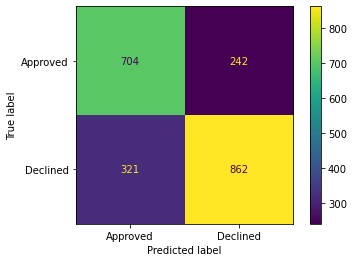

In [292]:
# performance evaluation
y_pred = np.zeros_like(y_test)
for idx in range(x_test.shape[0]):
     y_pred[idx] = tree_predict(tree_root_node, x_test.iloc[idx])

success_index_list = np.where(y_pred != 'Fail')[0] 
success_y_test = y_test.iloc[success_index_list]
success_y_pred = y_pred[success_index_list]

# task 7:
# ====================== START YOUR CODE HERE ======================
# get accuracy score
accuracy_major = accuracy_score(success_y_test, success_y_pred)
print('Testing accuracy with Decision Tree is {} %'.format(accuracy_major*100))

# confusion matrix to describe the performance of a classification model
print("Confusion Matrix:")
print(confusion_matrix(success_y_test, success_y_pred)) 
print(classification_report(success_y_test, success_y_pred))

# confusion matrix visualization
ConfusionMatrixDisplay.from_predictions(success_y_test, success_y_pred)
plt.show()
# ====================== END YOUR CODE HERE ========================

### 3.7. Printing the Decision Tree <a id='s37'></a>
You will use the following function `print_tree()` to recursively print out the decision tree and to save the result in a file named `decisionTree.txt`. 

In [293]:
def print_tree(node, w, indent=""):
    '''
    print each node recursively
    '''
    if not node.isLeaf:
        if node.threshold is None:
            #print discrete node
            for index, child in enumerate(node.children):
                if child.isLeaf:
                    w.write(indent + str(node.label) + " = " + str(node.children_features[index]) + " : " + str(child.label) + '\n')
                else:
                    w.write(indent + str(node.label) + " = " + str(node.children_features[index]) + " : \n")
                    print_tree(child, w, indent + "	")
        else:
            #print numerical node
            leftChild = node.children[0]
            rightChild = node.children[1]
            if leftChild.isLeaf:
                w.write(indent + str(node.label) + " <= " + str(node.threshold) + " : " + str(leftChild.label) + '\n')
            else:
                w.write(indent + str(node.label) + " <= " + str(node.threshold)+" : \n")
                print_tree(leftChild, w, indent + " ")
            if rightChild.isLeaf:
                w.write(indent + str(node.label) + " > " + str(node.threshold) + " : " + str(rightChild.label) + '\n')
            else:
                w.write(indent + str(node.label) + " > " + str(node.threshold) + " : \n")
                print_tree(rightChild , w, indent + "    ")

You will execute the `print_tree()` function below to print the tree in a text file. 

In [294]:
# print the decision tree in a text file 
w = open('decisionTree.txt','w')
print_tree(tree_root_node, w)
w.close()

## 4. Random Forest <a id='section_4'></a>
Random Forest is a type of ensemble learning using bootstrap aggregation. Bootstrap aggregation (or bagging) reduces variance (noise) of model predictions by drawing (with replacement) many random training samples of datasets from a large dataset. Random Forest improves over bagging by taking a random fixed-size subset of features in the bootstrapped samples, thus reducing correlation among trees typically produced by bagging. 
### 4.1. Forest Generation <a id='section_41'></a>

**Task 8:** <a id='task_8'></a> you will implement the function `generate_forest()` to generate a single decision tree in each iteration. You will:

1. randomly select $m = 10$ features from all $M=27$ features. You should use the function [`np.random.choice()`](https://numpy.org/doc/stable/reference/random/generated/numpy.random.choice.html). Because you should choose $m$ features with replacement. Please set the parameters `size=` and `replace=` to correct values. (1 line)
2. randomly select $N=7,180$ items from the dataset in totally $N=7,180$ data items **with replacement**. Please use function [`sample()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sample.html) of pandas data (DataFrame) to finish this task. Also, please set the inputs `replace=` and `frac=` correctly. (1 line)
3. generate the decision tree with the selected features and data subset with your implemented function `generate_tree()`. (1 line)

In [310]:
# ramdom forest: decision tree list
def generate_forest(data_train, feature_name, class_name, tree_num):
    
    # create 'forest' variable to save decision trees
    forest = list()
    feature_subset_list = list()
    
    # number of selected features for each decision tree
    feature_num = 10
    for _ in range(tree_num):
        # print('Create Tree {}'.format(num))
        # task 8:
        # ====================== START YOUR CODE HERE ======================
        # your task is:
        # 1. randomly select subset of features from all the features. (1 line)
        # 2. randomly select subset of dataset from the whole training set (1 line)
        # 3. generate the decision tree with the selected features with function "generate_tree()". (1 line)
        feature_subset = np.random.choice(feature_name,size=10,replace=False).tolist()
        data_subset = data_train.sample(frac=1, replace=True)
        tree_root = generate_tree(data_subset,feature_subset,class_name)
        # ====================== END YOUR CODE HERE ========================
        feature_subset_list.append(feature_subset)
        forest.append(tree_root)
        
    return forest, feature_subset_list

To visualize the structure of decision trees in random forest, this assignment also shows how to use [`DecisionTreeClassifier()`](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier) using the [scikit-learn library](https://scikit-learn.org/) to construct a random forest. Because the implementation of decision tree in Scikit-learn does not accept categorical data, One-hot encoding must be done and [`DictVectorizer()`](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.DictVectorizer.html) is used to finish the encoding.  

In [298]:
# ramdom forest: decision tree list
def generate_forest_scikit(data_train, feature_name, class_name, tree_num):
    
    # create 'forest' variable to save decision trees
    forest = list()
    feature_vector = list()
    
    # number of selected features for each decision tree
    feature_num = int(np.sqrt(len(feature_name)))
    for _ in range(tree_num):
        feature_subset = np.random.choice(feature_name, size=feature_num, replace=False).tolist()
        data_subset = data_train.sample(frac=1, replace=True)
        sub_features = data_subset[feature_subset].to_dict('records')
        sub_labels = data_subset[class_name].replace({'Approved': 1, 'Declined': 0})
        
        # one-hot encoding
        vec = DictVectorizer()
        x_data = vec.fit_transform(sub_features).toarray()
        y_data = sub_labels.values
        
        # decision tree classifier
        tree_root = tree.DecisionTreeClassifier(criterion='entropy', max_depth=10)
        tree_root.fit(x_data, y_data)

        feature_vector.append(vec)
        forest.append(tree_root)
        
    return forest, feature_vector

### 4.2. Predictive Function <a id='section_42'></a>
When you have constructed a random forest with several decision trees (two versions: self-implemented and scikit-learn), your next task is to test the performance of two versions.

**Task 9:** <a id='task_9'></a> The first function `forest_predict()` will:

1. transform the result "prediction_list" into pandas data structure [`pd.Series`](https://pandas.pydata.org/docs/reference/api/pandas.Series.html) (1 line)
2. get prediction result with majority voting. Please use function [`mode()`](https://pandas.pydata.org/docs/reference/api/pandas.Series.mode.html) of pandas data  (1 line)

In [315]:
def forest_predict(forest, feature_subset_list, query): 
    
    prediction_list = list()
    # predict label in each decision tree of forest
    for tree_node, feature_subset in zip(forest, feature_subset_list):
        label = tree_predict(tree_node, query[feature_subset])
        prediction_list.append(label)
    
    # task 9:
    # ====================== START YOUR CODE HERE ======================
    # majority voting
    # get prediction result with majority voting. (about 1-2 line)
    result_list = pd.Series(prediction_list)
    major_result = result_list.mode()
    # ====================== END YOUR CODE HERE ========================
    return major_result[0]

The scikit-learn function `forest_predict_scikit()` is shown below.

In [316]:
def forest_predict_scikit(forest, feature_vector, query): 
    
    prediction_list = list()
    # predict label in each decision tree of forest
    for tree_node, vec in zip(forest, feature_vector):
        transformed_query = query.to_dict()
        encoded_query = vec.transform(transformed_query).toarray()
        label = tree_node.predict(encoded_query)
        prediction_list.append(label)

    result_list = pd.Series(prediction_list)
    major_result = result_list.mode()
    return major_result[0].item()

### 4.3. Performance Evaluation <a id='section_43'></a>
You will generate the random forest with your implemented function `generate_forest_scikit()` and evaluate its performance with `accuracy_score()`, `confusion_matrix()`, and `classification_report()` using the [scikit-learn library](https://scikit-learn.org/).

**Task 10:**  You will<a id='task_10'></a> 

1. check the accuracy score of the learned random forest with function [`accuracy_score()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html) (1 line)
2. get the classification report with [`ConfusionMatrixDisplay.from_predictions()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay.from_predictions), save it in "report" (1 line)
3. visualize the confusion matrix with [`ConfusionMatrixDisplay.from_predictions()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay.from_predictions). Repalce two `None` inputs with correct variables. (1 line)

Due to random sampling used in bagging and in feature sampling, the performance of random forest varies, and you should obtain an accuracy of 80% approximately. To accelrate the learning procedures, you can change the parameter `tree_number`. For example, if `tree_number=10`, then it will run much faster but the performance will vary significantly due to a higher variance. 

In [318]:
# generate random forest (this part requires aproximately 25 minutes depending on your hardware)
tree_number = 51
forest, tree_feature_subset = generate_forest(data_train, feature_name, class_name, tree_number)

Testing accuracy with Random Forest is 81.94057567316621 %
              precision    recall  f1-score   support

    Approved       0.78      0.82      0.80       960
    Declined       0.85      0.82      0.83      1194

    accuracy                           0.82      2154
   macro avg       0.82      0.82      0.82      2154
weighted avg       0.82      0.82      0.82      2154



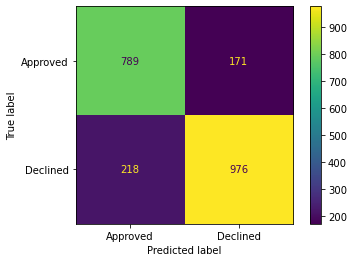

In [319]:
# performance evaluation
y_pred = np.zeros_like(y_test)
for idx in range(x_test.shape[0]):
    y_pred[idx] = forest_predict(forest, tree_feature_subset, x_test.iloc[idx])
    
success_index_list = np.where(y_pred != 'Fail')[0] 
success_y_test = y_test.iloc[success_index_list]
success_y_pred = y_pred[success_index_list]

# task 10:
# ====================== START YOUR CODE HERE ======================
# get accuracy score
accuracy_major = accuracy_score(success_y_test, success_y_pred)
print('Testing accuracy with Random Forest is {} %'.format(accuracy_major*100))

# confusion matrix to describe the performance of a classification model
report = classification_report(success_y_test, success_y_pred)
print(report)

# confusion matrix visualization
ConfusionMatrixDisplay.from_predictions(success_y_test, success_y_pred)
plt.show()
# ====================== END YOUR CODE HERE ========================

To evaluate the performance of random forest (RF), you will test the predictive accuracy using different numbers of trees in RF, ranging from 10 to 100 with an increment of 10. Every selected tree number (e.g., 10, 20, ... , 50, ... , 100) will be tested 10 times (specified in `test_num`). Note that __executing this part will need 25 minutes or longer__, depending on your hardware. So, after starting it, take a walk and get back in half an hour!

In [320]:
parameter_range = np.arange(10, 100, 10)
test_num = 10
performance_data = np.zeros((parameter_range.shape[0], test_num))

for i, tree_num in enumerate(parameter_range):
    for j in range(test_num):
        # generate random forest using decision trees using scikit-learn
        forest2, feature_vector = generate_forest_scikit(data_train, feature_name, class_name, tree_num)
        # performance evaluation
        y_pred = np.zeros_like(y_test)
        for idx in range(x_test.shape[0]):
            y_pred[idx] = forest_predict_scikit(forest2, feature_vector, x_test.iloc[idx])

        success_index_list = np.where(y_pred != -1)[0] 
        success_y_test = y_test.iloc[success_index_list].replace({'Approved': 1, 'Declined': 0}).values
        success_y_pred = y_pred[success_index_list].astype('int')

        # get accuracy score
        accuracy_major = accuracy_score(success_y_test, success_y_pred)
        performance_data[i, j] = accuracy_major

The following block includes the code for visualization. The mean value and standard variation are selected to reflect the distribution of resulting accuracy of random forest with different tree numbers. 

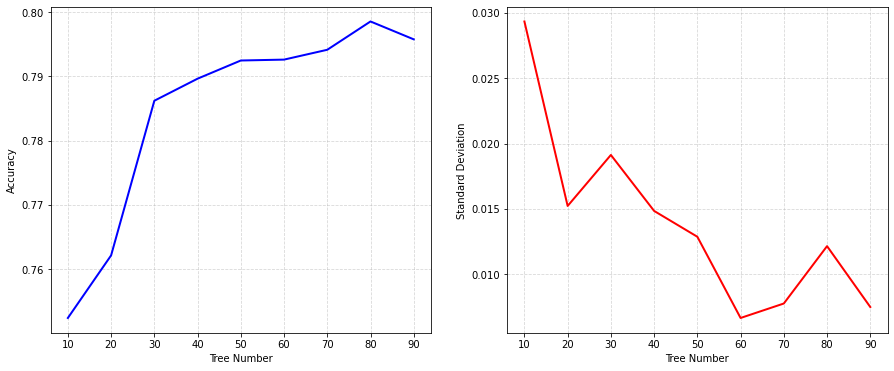

In [321]:
# visualize the performance increase
fig = plt.figure(figsize=(15, 6))
(ax1, ax2) = fig.subplots(1, 2)
ax1.plot(parameter_range, np.mean(performance_data, axis=1), color='b', linewidth=2)
ax1.set_xlabel("Tree Number")
ax1.set_ylabel("Accuracy")
ax1.grid(linestyle='--', alpha=0.5)

ax2.plot(parameter_range, np.std(performance_data, axis=1), color='r', linewidth=2)
ax2.set_xlabel("Tree Number")
ax2.set_ylabel("Standard Deviation")
ax2.grid(linestyle='--', alpha=0.5)

Upon executing the code below, a random forest with 5 decision trees is trained and visualized. When the trees are displayed below, you can double-click to enlarge the following figure and scroll through it to view the details.

In [322]:
small_forest, small_feature_vector = generate_forest_scikit(data_train, feature_name, class_name, 5)

forest_fig = plt.figure(figsize=(250, 150))
ax = forest_fig.subplots(len(small_forest), 1);
for idx, (tree_node, vec) in enumerate(zip(small_forest, small_feature_vector)):
    tree.plot_tree(tree_node, ax=ax[idx], feature_names=vec.feature_names_, 
                   class_names=['Decilined', 'Approved'], filled=True, fontsize=8);

## 5. Prediction of Sampled Data <a id='section_5'></a>
Finally, to show the prediction effect of the decision tree and the random forest more intuitively, several sampled data items in the testing dataset are used to predict decisions on automobile loan application.

In [323]:
# accuracy_score, confusion_matrix, classification_report
class_name = 'LoanStatus'
feature_name = list(raw_classification_data.columns)
feature_name.remove(class_name)

# new_sampled_data = raw_classification_data.sample(10, ignore_index=True)
sample_data_test = data_test.sample(10, ignore_index=True)
sample_x_test = sample_data_test[feature_name]

sample_y_test = np.atleast_2d(sample_data_test[class_name].values).T
sample_y_pred_dt = np.zeros_like(sample_y_test)
sample_y_pred_rf = np.zeros_like(sample_y_test)

success_idx_list = list()
for idx in range(sample_x_test.shape[0]):
    sample_y_pred_dt[idx] = tree_predict(tree_root_node, sample_x_test.loc[idx])
    sample_y_pred_rf[idx] = forest_predict(forest, tree_feature_subset, sample_x_test.loc[idx])

sample_data_test['LoanStatus_DecisionTree'] = sample_y_pred_dt
sample_data_test['LoanStatus_RandomForest'] = sample_y_pred_rf
sample_data_test.head(10)

,Source,ModifiedCreditScore,ModifiedBankruptcyScore,EmploymentStatus,EmployedMonths,TotalMonthlyIncome,PrimeMonthlyLiability,PrimeMonthlyRent,TotalMonthlyDebtBeforeLoan,VehicleYear,...,EstimatedMonthlyPayment,NumberOfOpenRevolvingAccounts,LTV,RequestType,DTI,MemberIndicator,CoApplicantIndicator,LoanStatus,LoanStatus_DecisionTree,LoanStatus_RandomForest
0,GATEWAY,787,382,Employed,84,8980.00,1305.0,0.0,1305.0,4,...,237.20,8.0,0.5396,INDIRECT,0.14532,N,Y,Approved,Approved,Approved
1,GATEWAY,719,319,Employed,9,4467.00,1658.0,0.0,1658.0,1,...,562.35,6.0,0.8076,INDIRECT,0.37117,N,N,Approved,Approved,Approved
2,GATEWAY,674,311,Employed,48,3583.33,596.0,0.0,596.0,4,...,404.56,5.0,1.1535,CAR SALE,0.16633,N,N,Approved,Approved,Approved
3,GATEWAY,752,429,Employed,72,6583.00,31.0,800.0,831.0,4,...,353.85,6.0,1.1305,INDIRECT,0.12623,N,N,Approved,Approved,Approved
4,GATEWAY,837,360,Employed,120,9916.67,2855.0,0.0,2855.0,4,...,516.36,5.0,0.7826,CAR SALE,0.28790,N,Y,Approved,Approved,Approved
5,GATEWAY,719,359,Employed,36,3000.00,0.0,350.0,350.0,2,...,380.08,0.0,1.1942,INDIRECT,0.11667,Y,N,Approved,Approved,Declined
6,CONSUMER,681,341,Employed,15,2000.00,0.0,300.0,300.0,4,...,178.58,0.0,1.0000,DEALER PURCHASE,0.15000,N,N,Declined,Approved,Declined
7,LENDER,692,287,Retired,0,2291.00,100.0,300.0,400.0,5,...,308.77,1.0,1.0391,REFINANCE-PROMO,0.14738,Y,N,Approved,Approved,Approved
8,LENDER,635,311,Employed,109,3745.00,1061.0,300.0,1661.0,2,...,420.67,4.0,1.1945,REFINANCE-PROMO,0.44352,Y,Y,Declined,Approved,Approved
9,GATEWAY,769,293,Employed,12,5000.00,2019.0,0.0,2019.0,8,...,375.41,6.0,1.0490,INDIRECT,0.40380,N,N,Approved,Declined,Approved


## 6. Marking Scheme and Submission <a id='section_6'></a>

This part carries 80% of the assignment grade. The Quiz posted on Moodle carries 20%. Late submission will incur a 30% deduction. The marking scheme of this part follows.

**Task Summary**

| Task | Grade Points 
|:----|:----:         
| 1. Tree Node ([`Node()`](#task_1)) | 6
| 2. Entropy ([`entropy()`](#task_2)) | 10
| 3. Information Gain ([`compute_gain()`](#task_3)) | 10
| 4. Best Attribute Selection ([`split_attribute()`](#task_4)) | 10
| 5. Tree Generation ([`generate_tree()`](#task_5)) | 10
| 6. Tree Result Prediction ([`tree_predict()`](#task_6)) | 8
| 7. [Tree Evaluation](#task_7)  | 8
| 8. Forest Generation ([`generate_forest()`](#task_7)) | 6
| 9. Forest Result Prediction ([`forest_predict()`](#task_8)) | 4
| 10. [Forest Evaluation](#task_10)  | 8
| **TOTAL** | **80**

### Submission
You are required to upload to Moodle a zip file containing the following files.

1. Your completed Jupyter Notebook of this part. Please rename your file as `A2A_[SID]_[FirstnameLastname].ipynb` (where `[SID]` is your student ID and `[FirstnameLastname]` is your first name and last name concatenated) and do not include the data file. You must complete the **Acknowledgment** section in order for the file to be graded.
1. The PDF version (.pdf file) of your completed notebook (click `File > Download as > PDF via HTML` (If error occurs, you may download it as HTML and then save the HTML as PDF separately)).

In addition, please complete **A2Q: Assignment 2 -- Quiz** separately on the Moodle site.

## 7. Summary <a id='section_7'></a>
Congratulations! You have implemented your Decision Tree (DT) and Random Forest (RF) machine learning algorithm in this course! To summarize, you have implemented the basic data structure "Node" of decision tree, entropy, information gain, attribute separation, recursive tree generation, forest generation and the evaluation of decision tree and random forest. You have run the algorithm to identify the optimal DT and the RF model using the training dataset, evaluated the performance of the model using the testing dataset, and applied the model to predicting prices of sampled data.